# Analyzing Object Detection Dataset
In this tutorial, we will analyze an object detection dataset with bounding boxes and identify potential issues.

## Installation & Setting Up
This notebook is written to be run on Google Colab. If you're running fastdup locally, view the installation instructions for your operating system here.

In [ ]:
!pip install pip -U
!pip install fastdup
!pip install pandas
!pip install plotly
!pip install gdown
!pip install wurlitzer
!pip install plotly
%load_ext wurlitzer

## Download Dataset
We will be using the mini-coco dataset for this tutorial.

In [ ]:
# Download images from mini-coco
!gdown --fuzzy https://drive.google.com/file/d/1iSXVTlkV1_DhdYpVDqsjlT4NJFQ7OkyK/view
!unzip coco_minitrain_25k.zip

# Download csv annotations
!cd coco_minitrain_25k/annotations && gdown --fuzzy https://drive.google.com/file/d/1i12p23cXlqp1QrXjAD_vu467r4q67Mq9/view

## Load annotations
We will use a simple converter to convert the COCO format JSON annotaion file into the fastdup annotation dataframe. This converter is applicable to any dataset which uses COCO format.

In [ ]:
import fastdup
import pandas as pd

In [ ]:
coco_csv = 'coco_minitrain_25k/annotations/coco_minitrain2017.csv'
coco_annotations = pd.read_csv(coco_csv, header=None, names=['img_filename', 'bbox_x', 'bbox_y',
                                                             'bbox_w', 'bbox_h', 'label', 'ext'])

coco_annotations['split'] = 'train'  # Only train files were loaded
coco_annotations = coco_annotations.drop_duplicates()

In [24]:
coco_annotations.head(3)

,img_filename,bbox_x,bbox_y,bbox_w,bbox_h,label,ext,split,fastdup_id
0,000000131075.jpg,20.23,55.98,313.49,326.50,tv,0,train,0.0
1,000000131075.jpg,176.90,381.12,286.20,136.63,laptop,0,train,1.0
2,000000131075.jpg,369.96,361.35,72.76,73.91,laptop,0,train,2.0


## Run fastdup

In [7]:
# run fastdup with annotations
image_dir = 'coco_minitrain_25k/images/train2017/'
work_dir = 'fastdup_minicoco'

fd = fastdup.create(work_dir=work_dir, input_dir=image_dir)
fd.run(annotations=coco_annotations)

2023-03-22 16:23:22 [ERROR] Error: found invalid bounding box for image coco_minitrain_25k/images/train2017/000000564557.jpg. Please check bounding box file 30 271 5 0
2023-03-22 16:24:03 [ERROR] Error: found invalid bounding box for image coco_minitrain_25k/images/train2017/000000183338.jpg. Please check bounding box file 241 287 3 0
2023-03-22 16:26:03 [ERROR] Error: found invalid bounding box for image coco_minitrain_25k/images/train2017/000000088835.jpg. Please check bounding box file 292 200 3 0eatures
2023-03-22 16:26:24 [ERROR] Error: found invalid bounding box for image coco_minitrain_25k/images/train2017/000000168890.jpg. Please check bounding box file 7 95 1 0
2023-03-22 16:27:09 [ERROR] Error: found invalid bounding box for image coco_minitrain_25k/images/train2017/000000171360.jpg. Please check bounding box file 339 181 8 0res
2023-03-22 16:27:19 [ERROR] Error: found invalid bounding box for image coco_minitrain_25k/images/train2017/000000376491.jpg. Please check bounding b

## Get class statistics

In [8]:
fd.annotations()['label'].value_counts()

person           50336
chair             7870
car               7703
bottle            4330
cup               4154
                 ...  
toothbrush         309
bear               296
parking meter      183
toaster             46
hair drier          40
Name: label, Length: 80, dtype: int64

## Class distribution
The dataset contains 25k images and 183k objects, an average of 7.3 objects per image. 

Interestingly, we see a highly unbalanced class distribution, where all 80 coco classes are present here, but there is a strong balance towards the person class, that accounts for over 56k instances (30.6%). Car and Chair classes also contain over 8k instances each, while at the bottom of the list the toaster and hair drier classes contain as few as 40 instances. 

Using `Plotly` we get a useful interactive histogram. 

In [11]:
import plotly.express as px
fig = px.histogram(coco_annotations, x="label")
fig.show()

## Duplicates
First we visualize the general lists of duplicates

tv


100%|██████████| 20/20 [00:00<00:00, 58.56it/s]


Finished OK. Components are stored as image files fastdup_minicoco/galleries/components_[index].jpg
Stored components visual view in  fastdup_minicoco/galleries/components.html
Execution time in seconds 25.6



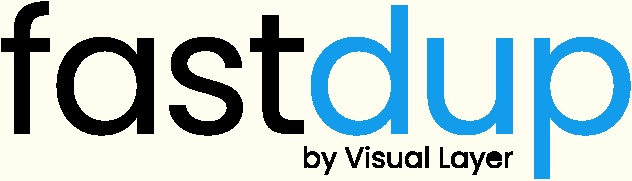
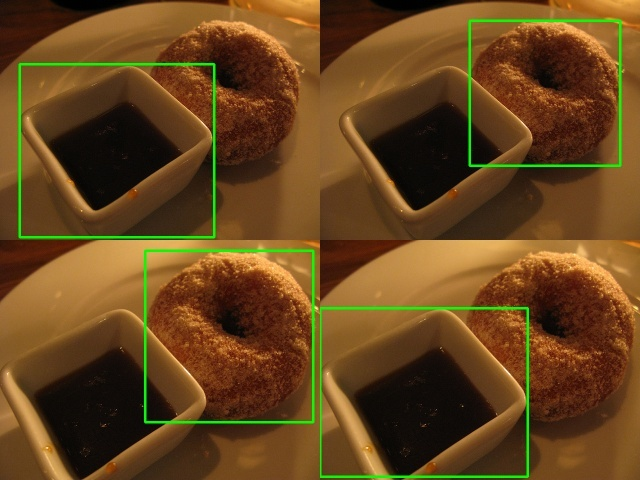
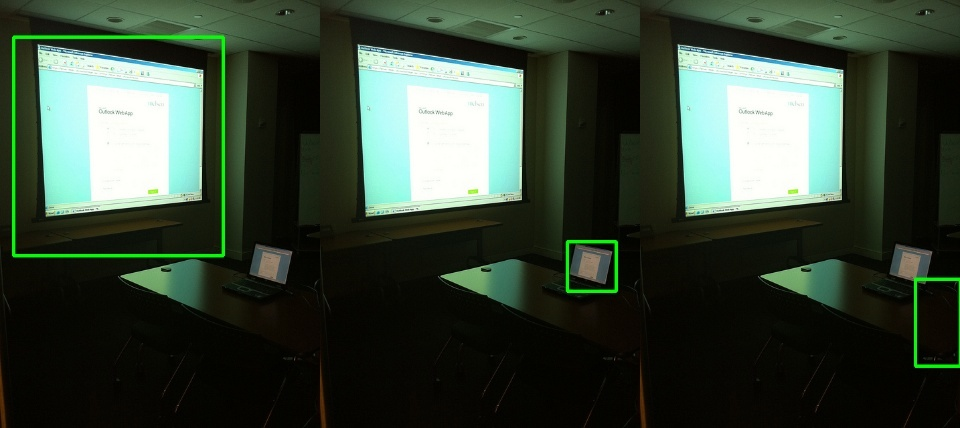
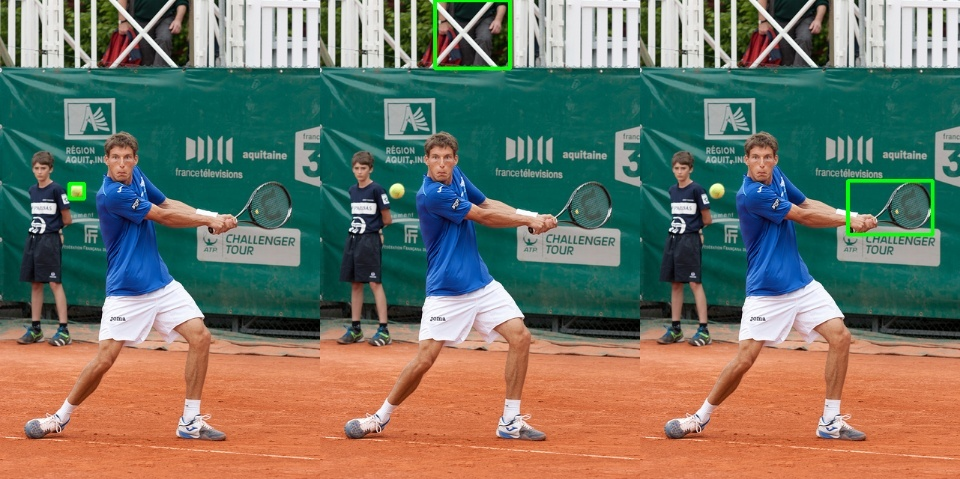
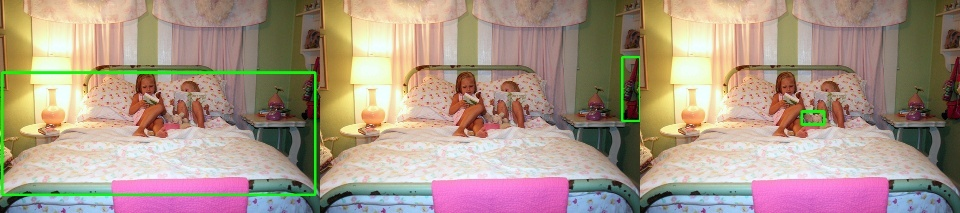
...
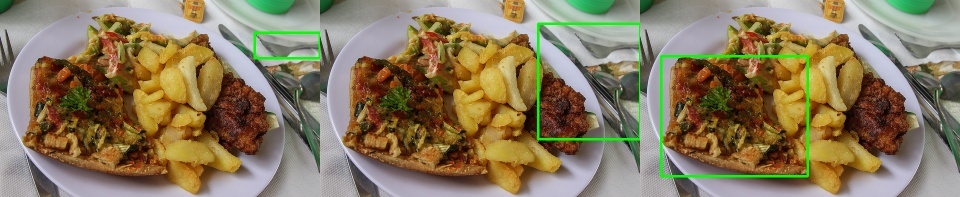
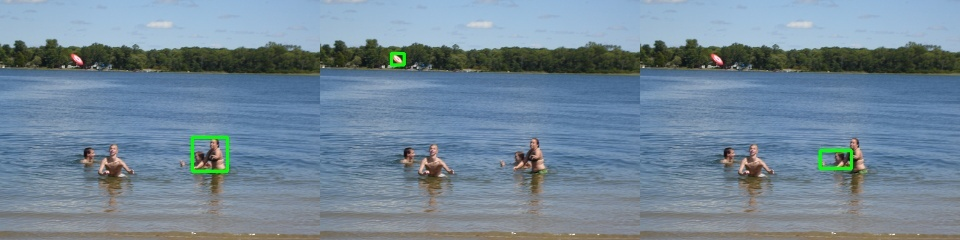
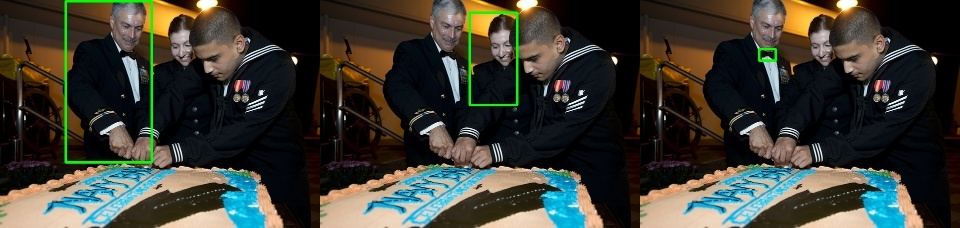
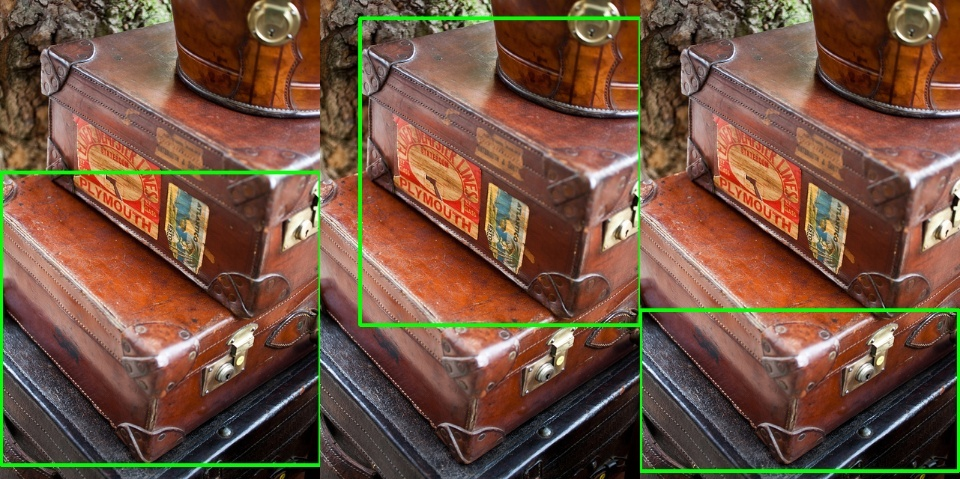
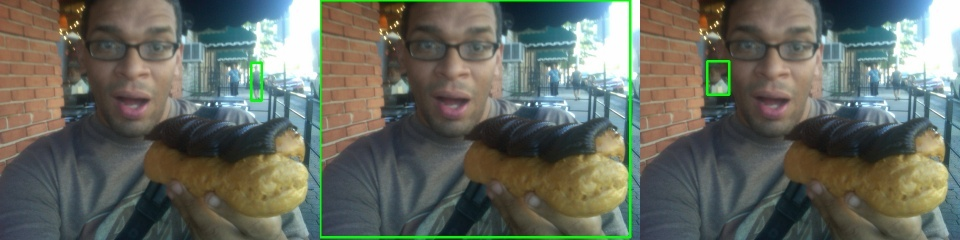

In [12]:
fd.vis.component_gallery(min_items=2)

## Filter & Sort Galleries

tv


100%|██████████| 20/20 [00:00<00:00, 39.56it/s]


Finished OK. Components are stored as image files fastdup_minicoco/galleries/components_[index].jpg
Stored components visual view in  fastdup_minicoco/galleries/components.html
Execution time in seconds 26.1



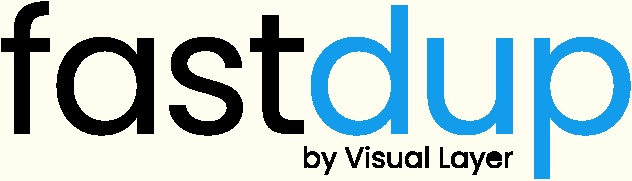
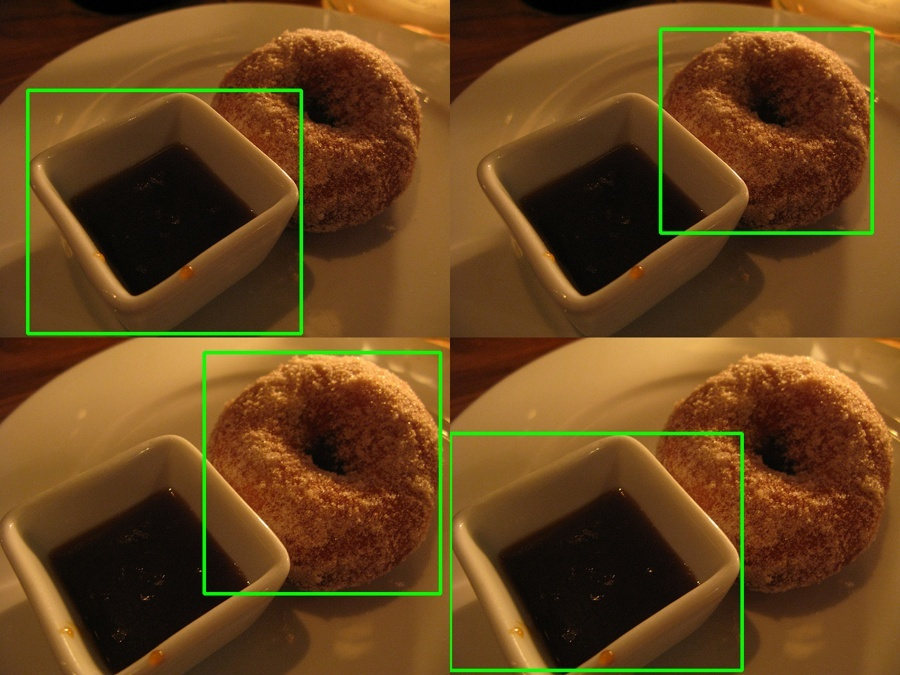
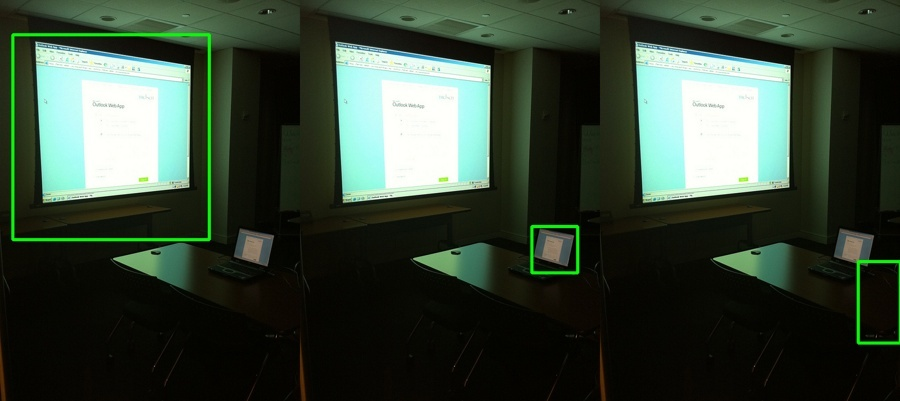
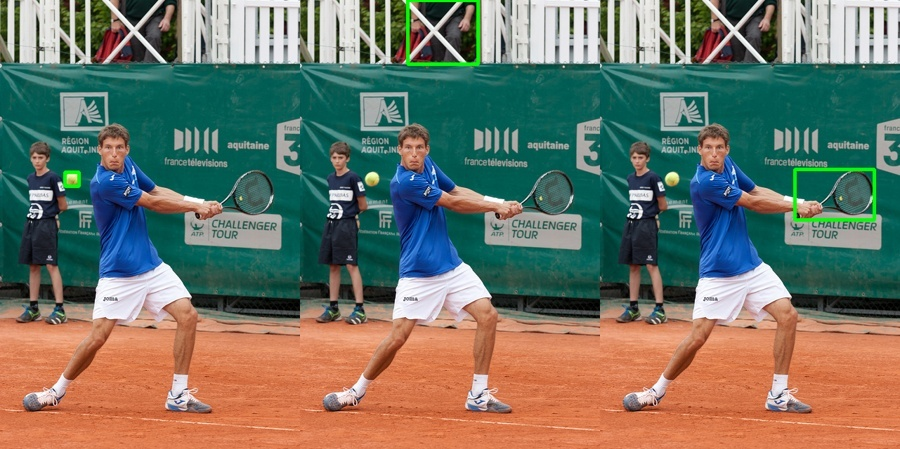
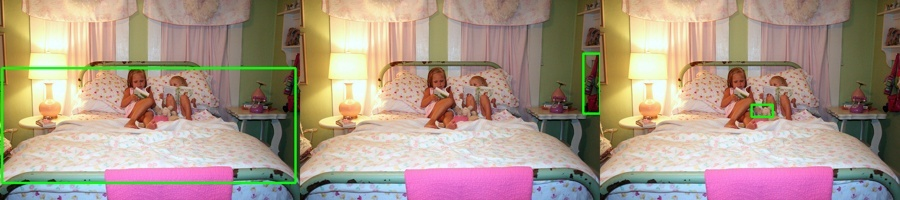
...
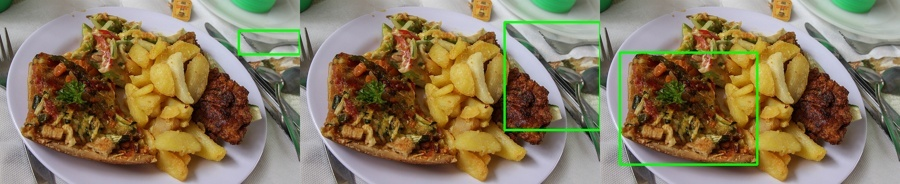
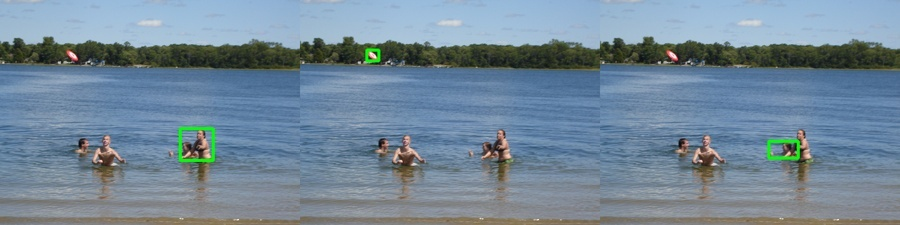
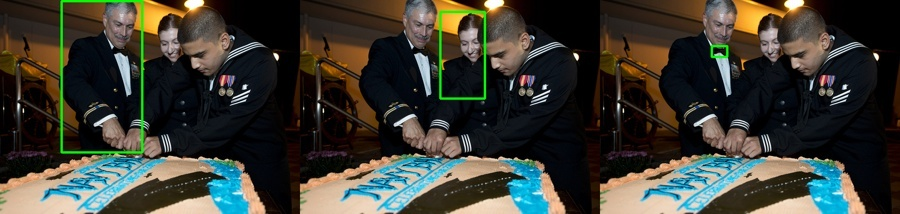
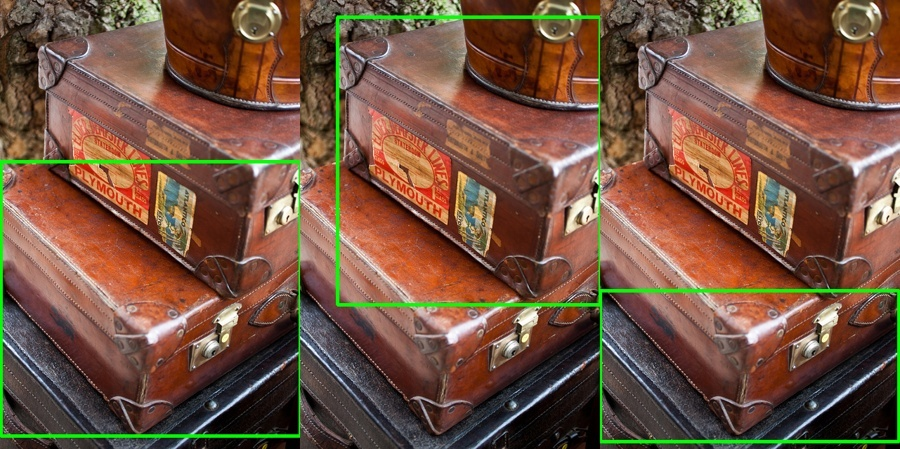
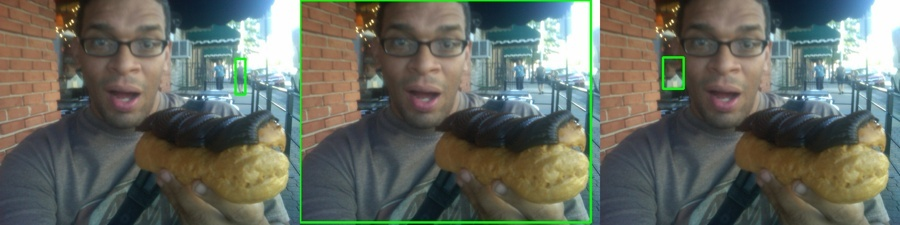

In [13]:
# sorting by largest objects
fd.vis.component_gallery(sort_by='area', min_items=2, max_width=900)

person


100%|██████████| 20/20 [00:00<00:00, 42.44it/s]

Finished OK. Components are stored as image files fastdup_minicoco/galleries/components_[index].jpg


Stored components visual view in  fastdup_minicoco/galleries/components.html
Execution time in seconds 20.0



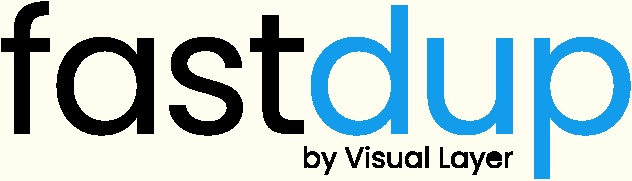
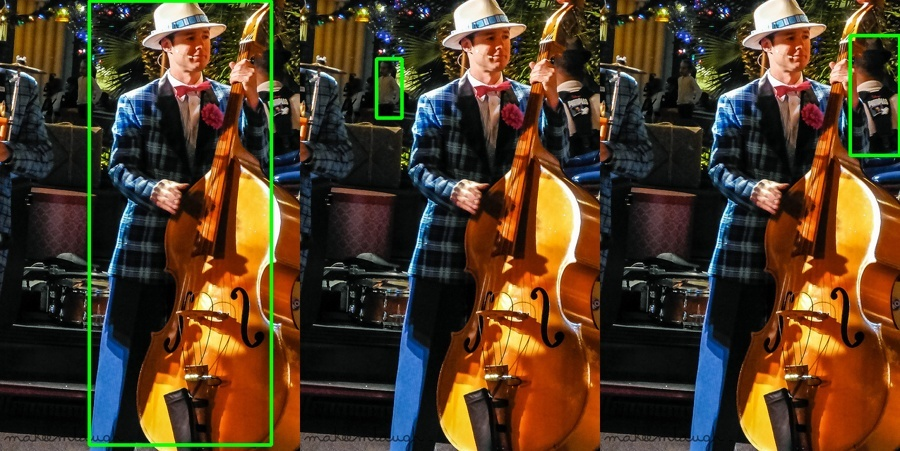
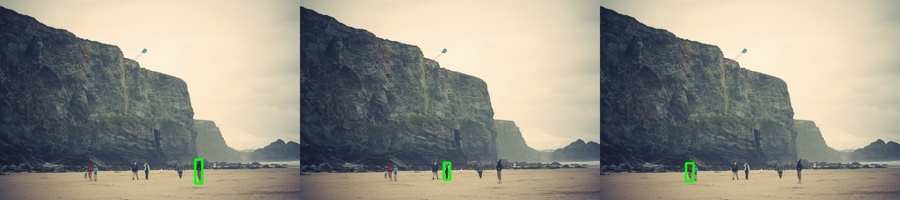
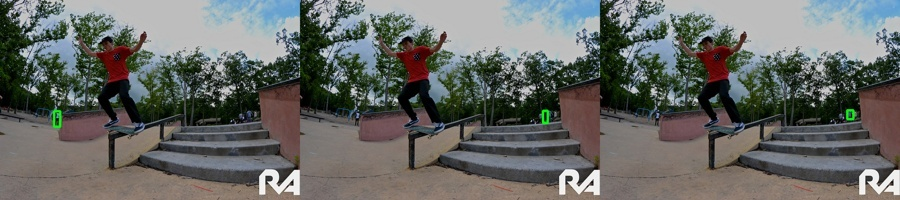
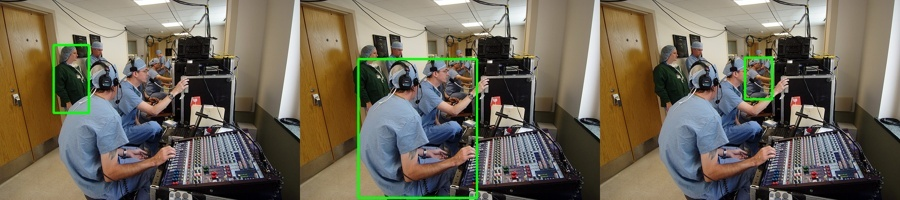
...
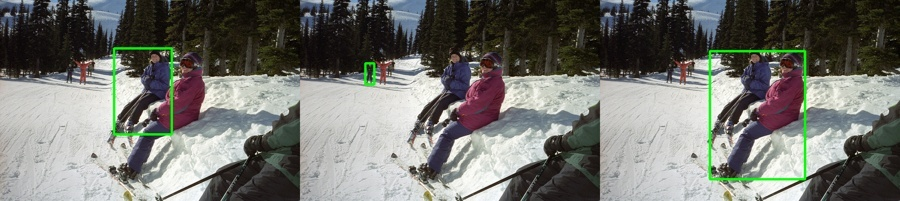
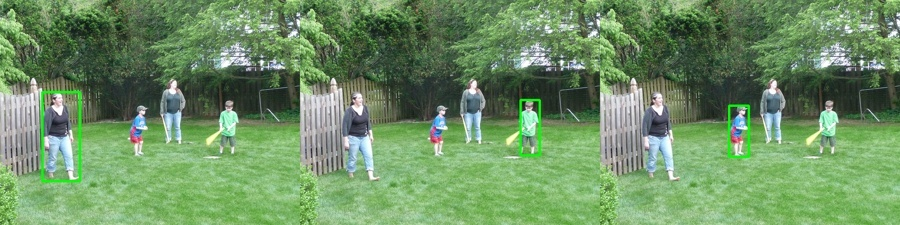
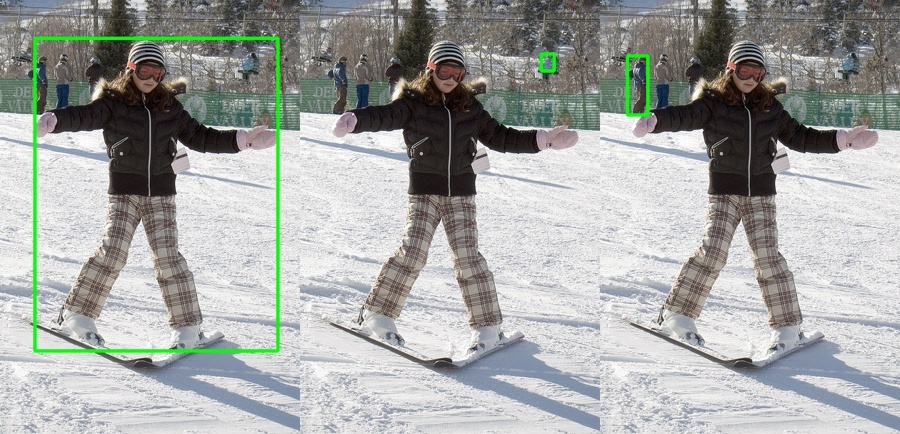
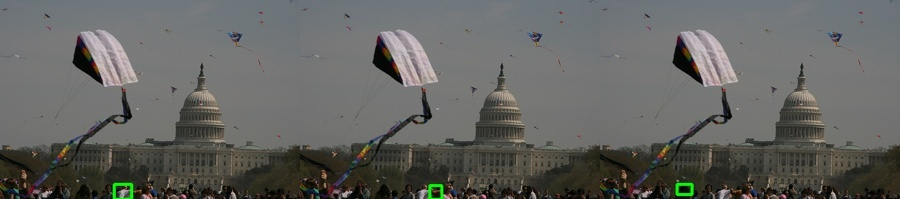
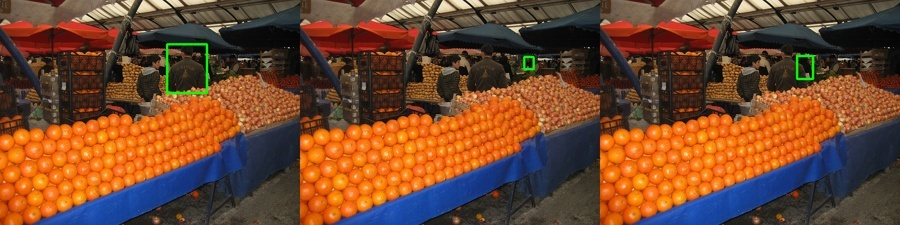

In [14]:
# clusters with 'person' labels
fd.vis.component_gallery(sort_by='area', min_items=2, slice='person', max_width=900)

## Outliers

100%|██████████| 20/20 [00:00<00:00, 25575.02it/s]


Stored outliers visual view in  fastdup_minicoco/galleries/outliers.html



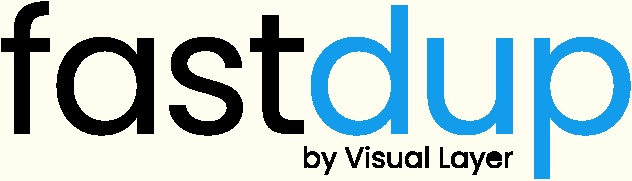
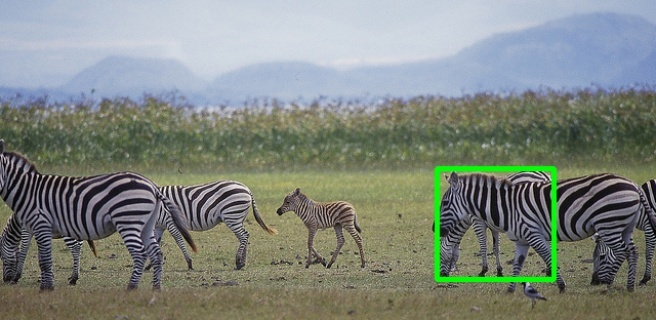
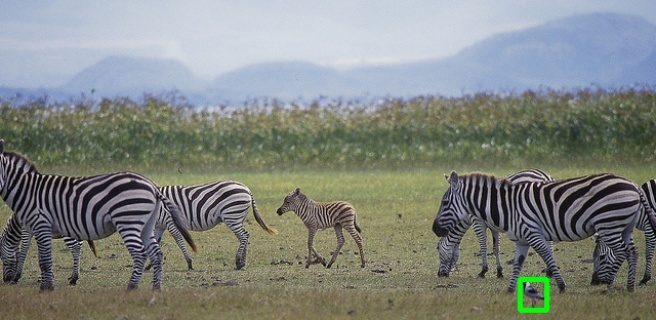
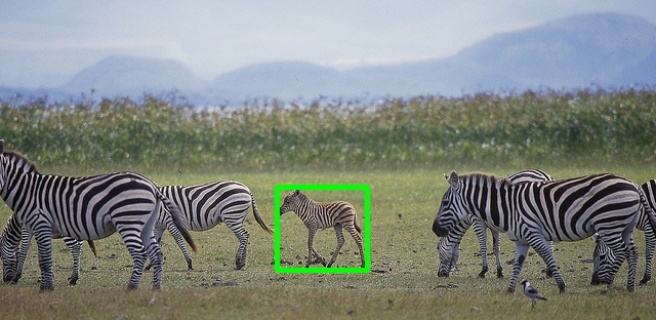
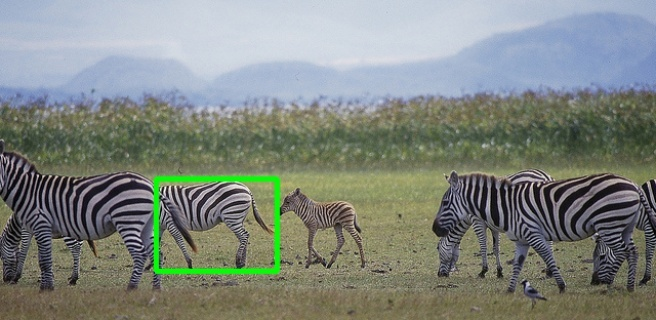
...
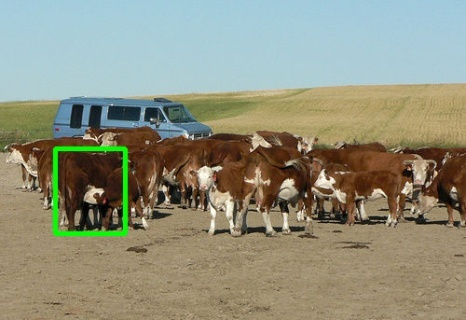
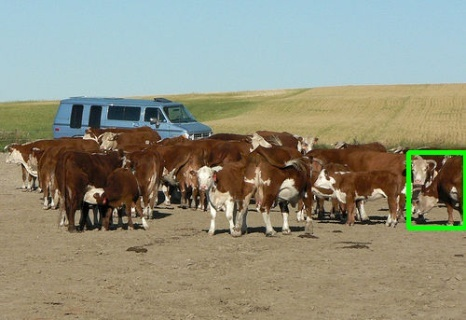
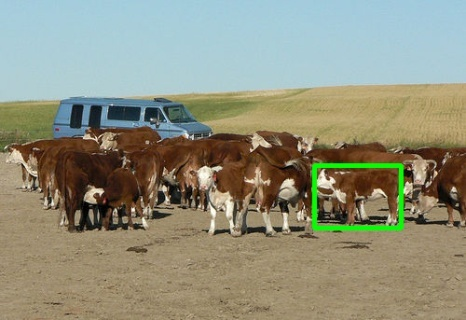
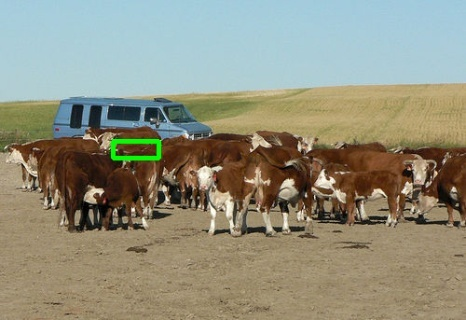
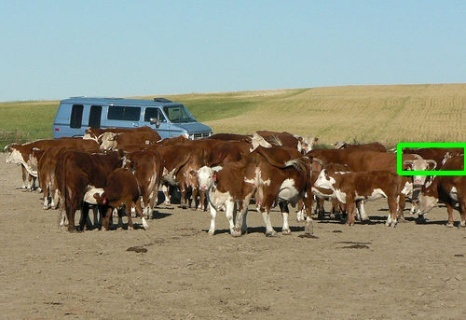

In [15]:
# visualize outliers
fd.vis.outliers_gallery()

## Size and shape issues
Objects come in various shapes and sizes, and sometimes objects might be incorrectly labeled or too small to be useful. We will now find the smallest, narrowest and widest objects, and asses their usefulness. 

In [16]:
annot = fd.annotations()
annot['area'] = annot['bbox_w'] * annot['bbox_h']
annot['aspect'] = annot['bbox_w'] / annot['bbox_h']

/tmp/ipykernel_379424/61978295.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_379424/61978295.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [17]:
# Smallest 5% of objects:
smallest_objects = annot[annot['area'] < annot['area'].quantile(0.05)].sort_values(by=['area'])

# 5% of extreme aspect ratios
aspect_ratio_objects = annot[(annot['aspect'] < annot['aspect'].quantile(0.05))
                             | (annot['aspect'] > annot['aspect'].quantile(0.95))].sort_values(by=['aspect'])


In [18]:
# let's see the smallest objects
smallest_objects.head(3)

,img_filename,bbox_x,bbox_y,bbox_w,bbox_h,label,ext,split,fastdup_id,error_code,is_valid,area,aspect
fd_index,,,,,,,,,,,,,
110320,000000205392.jpg,580.76,232.51,10.00,10.00,person,0,train,110320,VALID,True,100.0000,1.0
131657,000000320957.jpg,183.84,300.01,10.02,10.02,apple,0,train,131657,VALID,True,100.4004,1.0
21376,000000407413.jpg,301.32,175.41,10.06,10.06,person,0,train,21376,VALID,True,101.2036,1.0


In [19]:
aspect_ratio_objects.head(3)

,img_filename,bbox_x,bbox_y,bbox_w,bbox_h,label,ext,split,fastdup_id,error_code,is_valid,area,aspect
fd_index,,,,,,,,,,,,,
134867,000000093298.jpg,230.69,1.11,16.64,419.24,kite,0,train,134867,VALID,True,6976.1536,0.039691
3642,000000002444.jpg,1.92,136.50,11.51,263.87,person,0,train,3642,VALID,True,3037.1437,0.043620
164216,000000116502.jpg,222.84,63.49,16.19,318.20,spoon,0,train,164216,VALID,True,5151.6580,0.050880


In [20]:
aspect_ratio_objects.tail(3)

,img_filename,bbox_x,bbox_y,bbox_w,bbox_h,label,ext,split,fastdup_id,error_code,is_valid,area,aspect
fd_index,,,,,,,,,,,,,
4261,000000527098.jpg,33.00,216.00,602.00,18.00,boat,0,train,4261,VALID,True,10836.0000,33.444444
77850,000000444692.jpg,1.12,58.60,638.88,15.74,bench,0,train,77850,VALID,True,10055.9712,40.589581
173218,000000516740.jpg,17.27,197.91,601.64,13.43,train,0,train,173218,VALID,True,8080.0252,44.798213


Look at that! The slices reveal many items that are either tiny (10x10 pixels) or have extreme aspect ratios - as extreme at 1:45 - an object 601 pixels wide by only 13 pixels high. 

## Objects that didn't make the cut:
Let's look at objects deemed invalid by fastdup. These are either objects that are too small to be useful in our analysis (smaller than 10px), have bouding boxes with illeagal values (negative or beyond image boundaries), or are part of images that are missing. We can tell which is which by the `error_code` column in our dataframe.

In [21]:
fd.invalid_instances().head(3)

,img_filename,bbox_x,bbox_y,bbox_w,bbox_h,label,ext,split,fastdup_id,error_code,is_valid
0,000000262162.jpg,437.17,244.79,19.52,9.93,mouse,0,train,16,ERROR_BAD_BOUNDING_BOX,False
1,000000524325.jpg,137.84,332.22,8.92,11.50,person,0,train,60,ERROR_BAD_BOUNDING_BOX,False
2,000000524325.jpg,177.35,294.13,5.32,11.92,person,0,train,65,ERROR_BAD_BOUNDING_BOX,False


## Distribution of error codes:
A simple `value_counts` will tell us the distribution of the errors. We have found 18,592 (!) bounding boxes that are either too small or go beyond image boundaries. This is 10% of the data! Filtering them would both save us grusome debugging of training errors and failures and help up provide the model with useful size objects. 

In [22]:
fd.invalid_instances()['error_code'].value_counts()

ERROR_BAD_BOUNDING_BOX    18592
Name: error_code, dtype: int64

## Find possible mislabels
The fastdup similarity search and gallery is a strong tool for finding objects that are possibly mislabeled. By finding each object's nearest neighbors and their classes, we can find objects with classes contradicting their neighbors' - a strong sign for mislabels.

100%|██████████| 25/25 [00:00<00:00, 35.50it/s]


Stored similar images visual view in  fastdup_minicoco/galleries/similarity.html



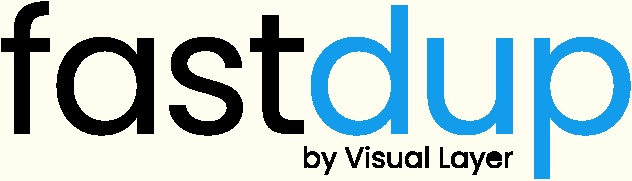
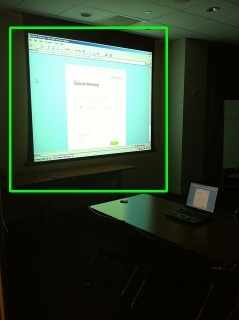
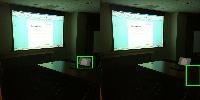
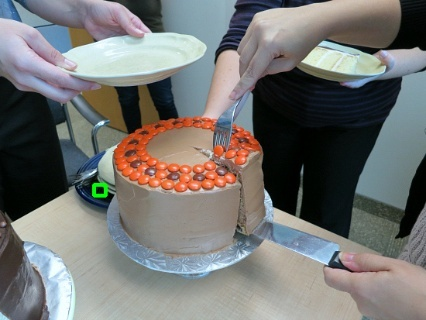
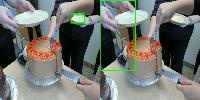
...
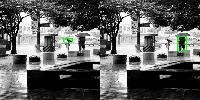
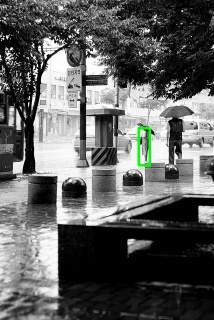
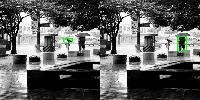
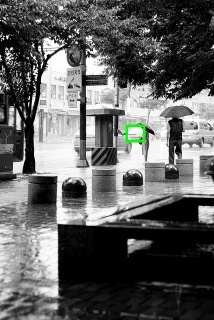
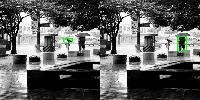

,from,to,label,label2,distance
0,coco_minitrain_25k/images/train2017/000000131075.jpg,"[coco_minitrain_25k/images/train2017/000000131075.jpg, coco_minitrain_25k/images/train2017/000000131075.jpg]","[tv, tv]","[laptop, chair]","[1.0, 1.0]"
93317,coco_minitrain_25k/images/train2017/000000205960.jpg,"[coco_minitrain_25k/images/train2017/000000205960.jpg, coco_minitrain_25k/images/train2017/000000205960.jpg]","[fork, fork]","[cake, person]","[1.0, 1.0]"
93314,coco_minitrain_25k/images/train2017/000000205960.jpg,"[coco_minitrain_25k/images/train2017/000000205960.jpg, coco_minitrain_25k/images/train2017/000000205960.jpg]","[chair, chair]","[cake, person]","[1.0, 1.0]"
93312,coco_minitrain_25k/images/train2017/000000205960.jpg,"[coco_minitrain_25k/images/train2017/000000205960.jpg, coco_minitrain_25k/images/train2017/000000205960.jpg]","[person, person]","[cake, person]","[1.0, 1.0]"
93311,coco_minitrain_25k/images/train2017/000000205960.jpg,"[coco_minitrain_25k/images/train2017/000000205960.jpg, coco_minitrain_25k/images/train2017/000000205960.jpg]","[cake, cake]","[cake, person]","[1.0, 1.0]"
...,...,...,...,...,...
65595,coco_minitrain_25k/images/train2017/000000052281.jpg,[coco_minitrain_25k/images/train2017/000000436246.jpg],[surfboard],[surfboard],[0.900703]
57345,coco_minitrain_25k/images/train2017/000000044964.jpg,[coco_minitrain_25k/images/train2017/000000195806.jpg],[elephant],[elephant],[0.900698]
1466,coco_minitrain_25k/images/train2017/000000394458.jpg,[coco_minitrain_25k/images/train2017/000000576157.jpg],[elephant],[elephant],[0.900692]
13649,coco_minitrain_25k/images/train2017/000000010698.jpg,[coco_minitrain_25k/images/train2017/000000436246.jpg],[surfboard],[person],[0.900671]


In [23]:
fd.vis.similarity_gallery(label_col='label', num_images=25)